<a href="https://colab.research.google.com/github/advcloud/colabtest/blob/main/yolov5robo1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!git clone https://github.com/roboflow-ai/yolov5  # clone repo, forked via https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt  # install dependencies
# change directory to our newly cloned YOLOv5 folder
%cd /content/yolov5
# import requirements
import torch
from IPython.display import Image  # for displaying images

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Cloning into 'yolov5'...
remote: Enumerating objects: 10239, done.
remote: Total 10239 (delta 0), reused 0 (delta 0), pack-reused 10239
Receiving objects: 100% (10239/10239), 10.61 MiB | 29.69 MiB/s, done.
Resolving deltas: 100% (7039/7039), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
/content/yolov5
torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [4]:
# Export code snippet and paste here
%cd /content
!curl -L "https://public.roboflow.ai/ds/vJUg9kAnOG?key=YOUR DATASET HERE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1910      0 --:--:-- --:--:-- --:--:--  1910
100 13.1M  100 13.1M    0     0  15.8M      0 --:--:-- --:--:-- --:--:-- 15.8M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/0062698133f26395_jpg.rf.e9b2569993bc01007ef55fefaf35bb06.jpg  
 extracting: test/images/00a20986a3abbd4c_jpg.rf.50b1ca7f159c4dfec2c937d46c5ebc16.jpg  
 extracting: test/images/020c527f9ca920b0_jpg.rf.888b13fd9f4fd6f226cee57f1d261aea.jpg  
 extracting: test/images/021aaa0943f6d074_jpg.rf.d9f8cf9240b41583276ac363cde8e8dd.jpg  
 extracting: test/images/06004a3ace5bcc1a_jpg.rf.5f9d9dc81f50aa0ac0b49cf21b60c072.jpg  
 extracting: test/images/07def16b30a3e9fe_jpg.rf.e060

In [5]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Teapot']

In [7]:
%cd /content/yolov5

/content/yolov5


In [8]:
!python train.py --img 640 --batch 8 --epochs 30 --data ../data.yaml --weights yolov5s.pt --device 0 --cfg ./models/yolov5s.yaml

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=30, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/roboflow-ai/yolov5 ✅
YOLOv5 🚀 v6.0-151-gabbdd48 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate

In [9]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.4 --source ../test/images/

detect: weights=['runs/train/exp/weights/best.pt'], source=../test/images/, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-151-gabbdd48 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/60 /content/test/images/0062698133f26395_jpg.rf.e9b2569993bc01007ef55fefaf35bb06.jpg: 640x640 Done. (0.013s)
image 2/60 /content/test/images/00a20986a3abbd4c_jpg.rf.50b1ca7f159c4dfec2c937d46c5ebc16.jpg: 640x640 1 Teapot, Done. (0.013s)
image 3/60 /content/test/images/020c527f9ca920b0_jpg.rf.888b13fd9f4fd6f226cee57f1d261aea.jpg: 640x640 1 Teapot, Done. (0.013s)
image 4/60 /content/test/images/

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [11]:
%ls ../test/images/021aaa0943f6d074_jpg.rf.d9f8cf9240b41583276ac363cde8e8dd.jpg

../test/images/021aaa0943f6d074_jpg.rf.d9f8cf9240b41583276ac363cde8e8dd.jpg


GROUND TRUTH TRAINING DATA:


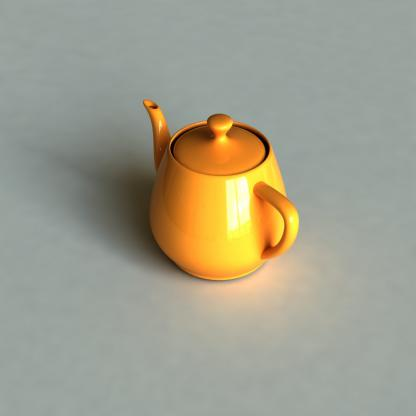

In [12]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='../test/images/021aaa0943f6d074_jpg.rf.d9f8cf9240b41583276ac363cde8e8dd.jpg', width=900)

In [15]:
# trained weights are saved by default in our weights folder
%ls runs/train/exp/weights/

best.pt  last.pt


In [16]:
!du runs/train/exp/weights/best.pt

14116	runs/train/exp/weights/best.pt


In [24]:
%ls runs/detect/exp



0062698133f26395_jpg.rf.e9b2569993bc01007ef55fefaf35bb06.jpg
00a20986a3abbd4c_jpg.rf.50b1ca7f159c4dfec2c937d46c5ebc16.jpg
020c527f9ca920b0_jpg.rf.888b13fd9f4fd6f226cee57f1d261aea.jpg
021aaa0943f6d074_jpg.rf.d9f8cf9240b41583276ac363cde8e8dd.jpg
06004a3ace5bcc1a_jpg.rf.5f9d9dc81f50aa0ac0b49cf21b60c072.jpg
07def16b30a3e9fe_jpg.rf.e060604675a04802832cc601fc4e5c00.jpg
092b11916fede3f7_jpg.rf.68d6c714f70246eafc1a767d010d3c85.jpg
0e76083b69cec3c0_jpg.rf.58327dd61f5bd2386c980251541b8c3c.jpg
1388bd2450021499_jpg.rf.1ec4dd3bbdd710ee6af8c87a85689ddc.jpg
168e75a68220235b_jpg.rf.fd2d10532aef36164c21709052b8fa5b.jpg
18b37a32a281f959_jpg.rf.fdf5a3adc97bd1c6342b8680ccc40c7f.jpg
1affe06ce742f941_jpg.rf.019aa7c83f2cd3dc0b4f95d9e6c8ad68.jpg
1f41bfda0da2f146_jpg.rf.e272072d67f7331b8eb4edb3b57c4e10.jpg
22721ab2ef93ea5e_jpg.rf.d32213cfcd6d4c75c0698f087eb4f23a.jpg
2544a28439ff86fe_jpg.rf.34a977f6694e1526340f59c3dd2e9c1d.jpg
2d97bd2be0b6e1bf_jpg.rf.432edfb46543c9f1752ef3e3b0556feb.jpg
3d95297691f3de4b_jpg.rf.

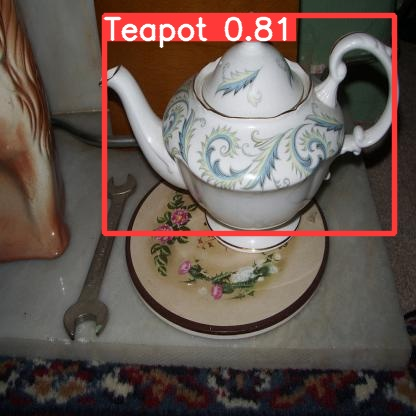

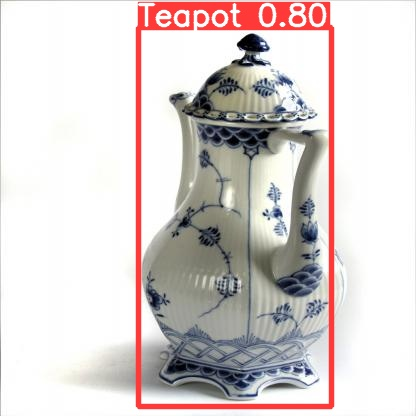

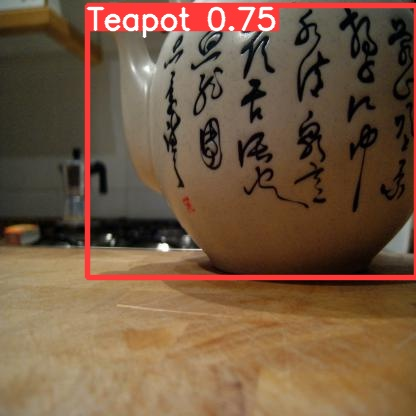

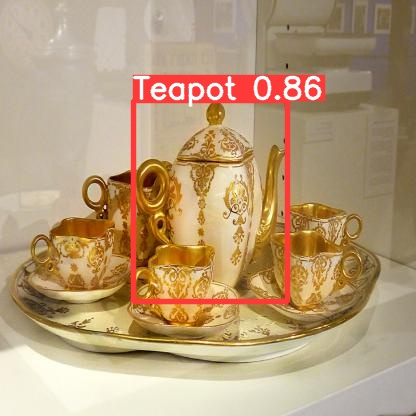

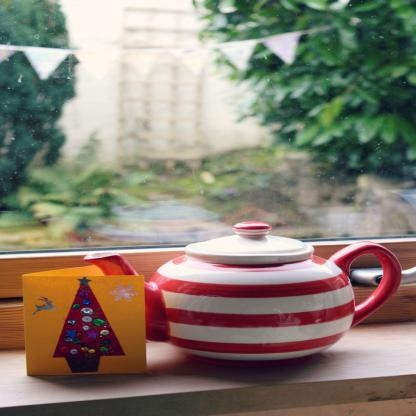

...

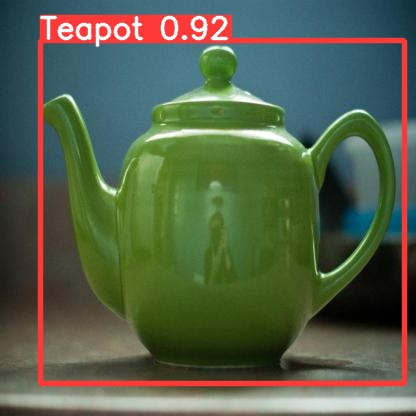

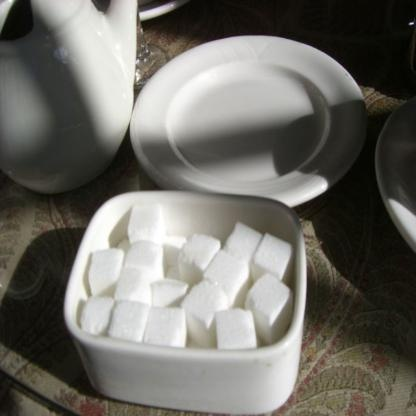

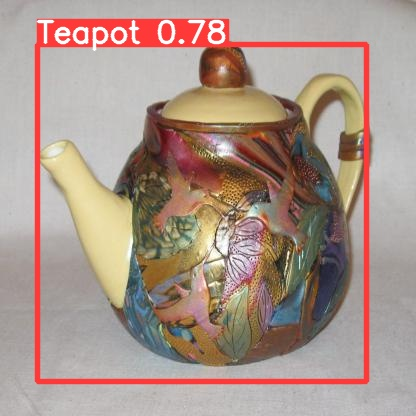

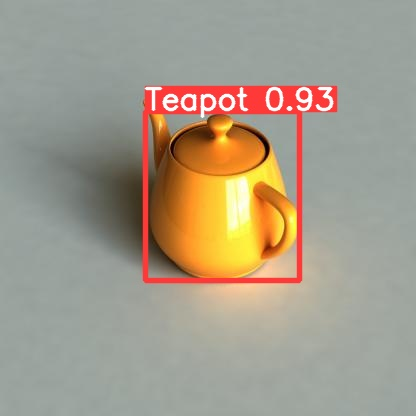

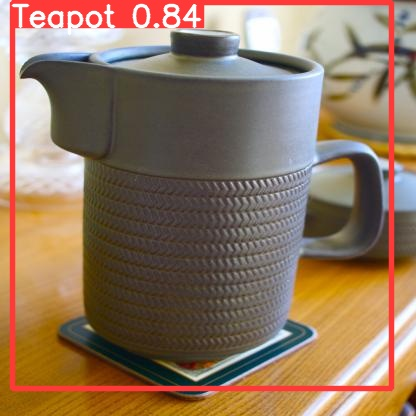

In [25]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5/weights/last_yolov5s_results.pt /content/gdrive/My\ Drive